<a href="https://colab.research.google.com/github/quartermaine/Hackathons/blob/master/Hackathon.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import files
uploaded = files.upload()
for fn in uploaded.keys():
   print("User uploaded file '{name}' with length {length} bytes".format(name=fn, length=len(uploaded[fn])))


Saving test_wF0Ps6O.csv to test_wF0Ps6O.csv
Saving train_HK6lq50.csv to train_HK6lq50.csv
User uploaded file 'test_wF0Ps6O.csv' with length 2260254 bytes
User uploaded file 'train_HK6lq50.csv' with length 5422426 bytes


In [0]:
!pip install pycaret

In [0]:
!pip install autoviz

In [0]:
from autoviz.AutoViz_Class import AutoViz_Class

Imported AutoViz_Class version: 0.0.68. Call using: 
    from autoviz.AutoViz_Class import AutoViz_Class
    AV = AutoViz_Class()
    AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
            
To remove previous versions, perform 'pip uninstall autoviz'


In [0]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode activated.


In [0]:
import pandas as pd 

train = pd.read_csv("/content/train_HK6lq50.csv")

test = pd.read_csv("/content/test_wF0Ps6O.csv")

Shape of your Data Set: (73147, 16)
Classifying variables in data set...
    16 Predictors classified...
        This does not include the Target column(s)
    1 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 15
Could not draw Distribution Plot
Number of Categorical and Continuous Vars exceeds limit, hence no Bar Plots
Time to run AutoViz (in seconds) = 4.480


,program_id,program_type,program_duration,test_id,test_type,difficulty_level,trainee_id,gender,education,city_tier,age,total_programs_enrolled,is_handicapped,trainee_engagement_rating,is_pass
0,Y_1,Y,136,150,offline,intermediate,9389,M,Matriculation,3,24.0,5,N,1.0,0
1,T_1,T,131,44,offline,easy,16523,F,High School Diploma,4,26.0,2,N,3.0,1
2,Z_2,Z,120,178,online,easy,13987,M,Matriculation,1,40.0,1,N,2.0,1
3,T_2,T,117,32,offline,easy,13158,F,Matriculation,3,NaN,4,N,1.0,1
4,V_3,V,131,84,offline,intermediate,10591,F,High School Diploma,1,42.0,2,N,4.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73142,Z_3,Z,130,161,offline,easy,3882,F,High School Diploma,3,NaN,1,N,2.0,1
73143,T_2,T,117,38,online,easy,3426,F,High School Diploma,2,45.0,2,N,2.0,1
73144,Y_2,Y,120,142,online,easy,13063,M,Matriculation,2,NaN,3,N,4.0,1
73145,V_3,V,131,82,offline,intermediate,5667,M,High School Diploma,3,27.0,2,N,2.0,1


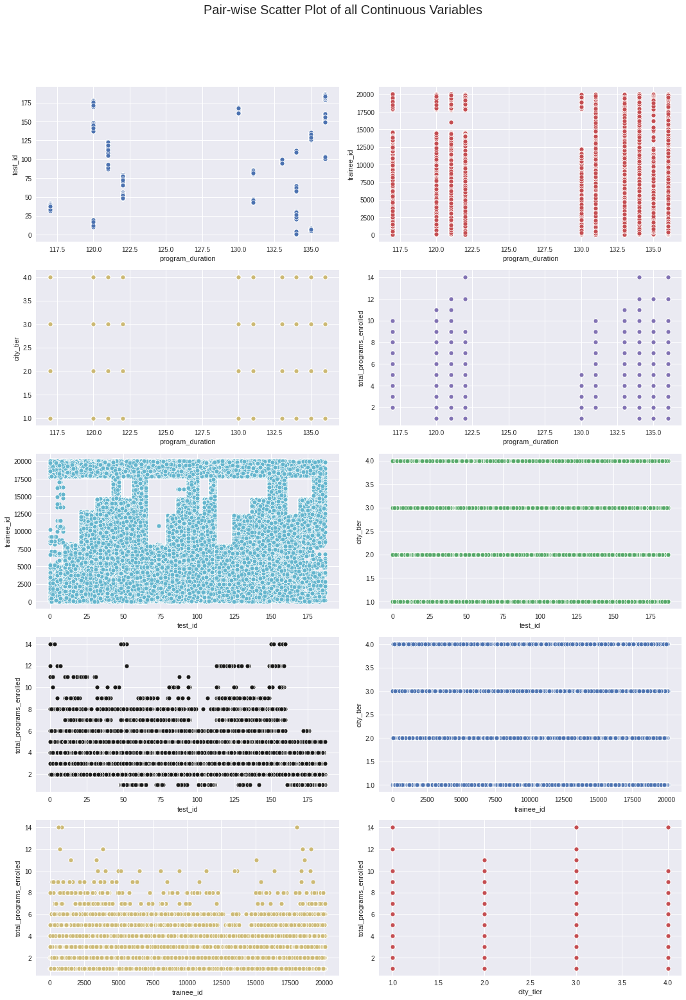

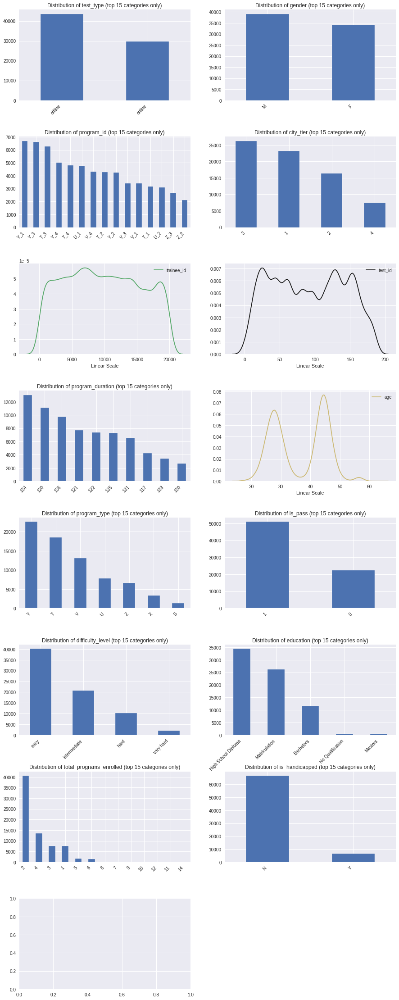

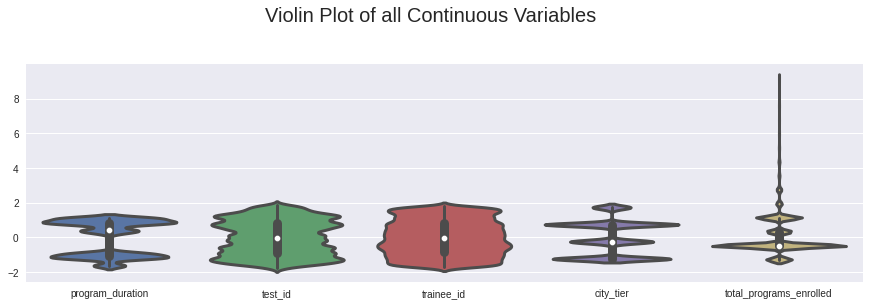

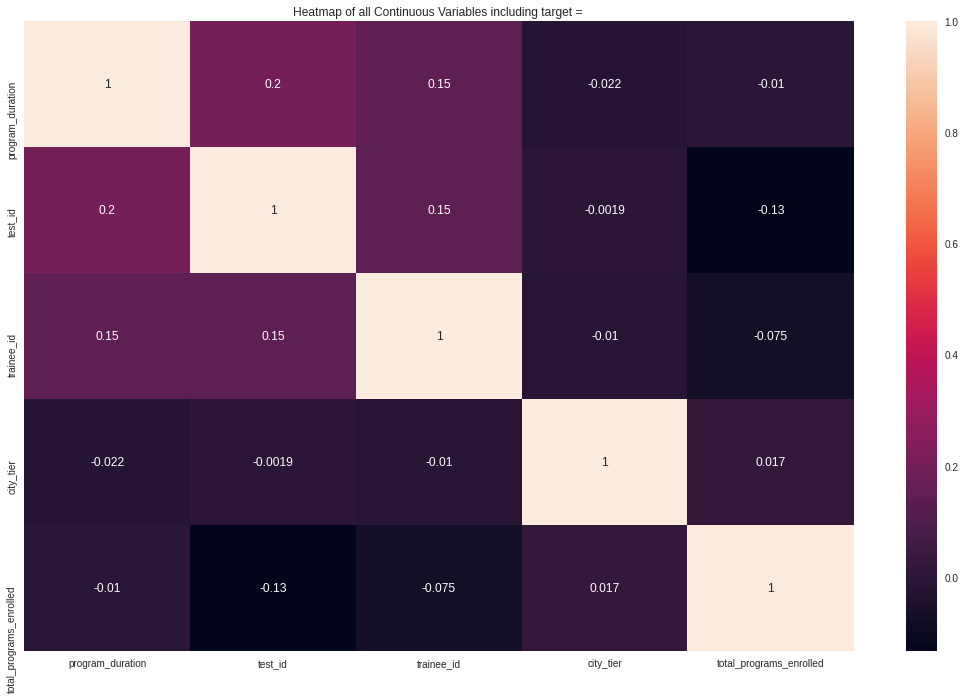

In [0]:
AV = AutoViz_Class()

AV.AutoViz("/content/train_HK6lq50.csv")

In [0]:
train.head()

,id,program_id,program_type,program_duration,test_id,test_type,difficulty_level,trainee_id,gender,education,city_tier,age,total_programs_enrolled,is_handicapped,trainee_engagement_rating,is_pass
0,9389_150,Y_1,Y,136,150,offline,intermediate,9389,M,Matriculation,3,24.0,5,N,1.0,0
1,16523_44,T_1,T,131,44,offline,easy,16523,F,High School Diploma,4,26.0,2,N,3.0,1
2,13987_178,Z_2,Z,120,178,online,easy,13987,M,Matriculation,1,40.0,1,N,2.0,1
3,13158_32,T_2,T,117,32,offline,easy,13158,F,Matriculation,3,NaN,4,N,1.0,1
4,10591_84,V_3,V,131,84,offline,intermediate,10591,F,High School Diploma,1,42.0,2,N,4.0,1


In [0]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73147 entries, 0 to 73146
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   id                         73147 non-null  object 
 1   program_id                 73147 non-null  object 
 2   program_type               73147 non-null  object 
 3   program_duration           73147 non-null  int64  
 4   test_id                    73147 non-null  int64  
 5   test_type                  73147 non-null  object 
 6   difficulty_level           73147 non-null  object 
 7   trainee_id                 73147 non-null  int64  
 8   gender                     73147 non-null  object 
 9   education                  73147 non-null  object 
 10  city_tier                  73147 non-null  int64  
 11  age                        45418 non-null  float64
 12  total_programs_enrolled    73147 non-null  int64  
 13  is_handicapped             73147 non-null  obj

In [0]:
train.trainee_engagement_rating = train.trainee_engagement_rating.astype(object)
train.is_pass = train.is_pass.astype(object)
train.city_tier = train.city_tier.astype(object)
train.dtypes

id                            object
program_id                    object
program_type                  object
program_duration               int64
test_id                        int64
test_type                     object
difficulty_level              object
trainee_id                     int64
gender                        object
education                     object
city_tier                     object
age                          float64
total_programs_enrolled        int64
is_handicapped                object
trainee_engagement_rating     object
is_pass                       object
dtype: object

In [0]:
test.trainee_engagement_rating = test.trainee_engagement_rating.astype(object)
test.city_tier = test.city_tier.astype(object)
test.dtypes

id                            object
program_id                    object
program_type                  object
program_duration               int64
test_id                        int64
test_type                     object
difficulty_level              object
trainee_id                     int64
gender                        object
education                     object
city_tier                     object
age                          float64
total_programs_enrolled        int64
is_handicapped                object
trainee_engagement_rating     object
dtype: object

# Missing data


In [0]:
#import seaborn
import seaborn as sb
import matplotlib.pyplot as plt

sb.set(style="whitegrid", color_codes=True) #set styling preferences
sb.set(rc={'figure.figsize':(12,8.27)})


In [0]:
def missing_values(df) :
  missing = df.isnull().mean().round(4) * 100
  missing = missing.to_frame()
  missing = missing.reset_index()
  missing.columns = ['Name', 'Percentage']
  return missing

missing = missing_values(train)
missing

,Name,Percentage
0,id,0.00
1,program_id,0.00
2,program_type,0.00
3,program_duration,0.00
4,test_id,0.00
5,test_type,0.00
6,difficulty_level,0.00
7,trainee_id,0.00
8,gender,0.00
9,education,0.00


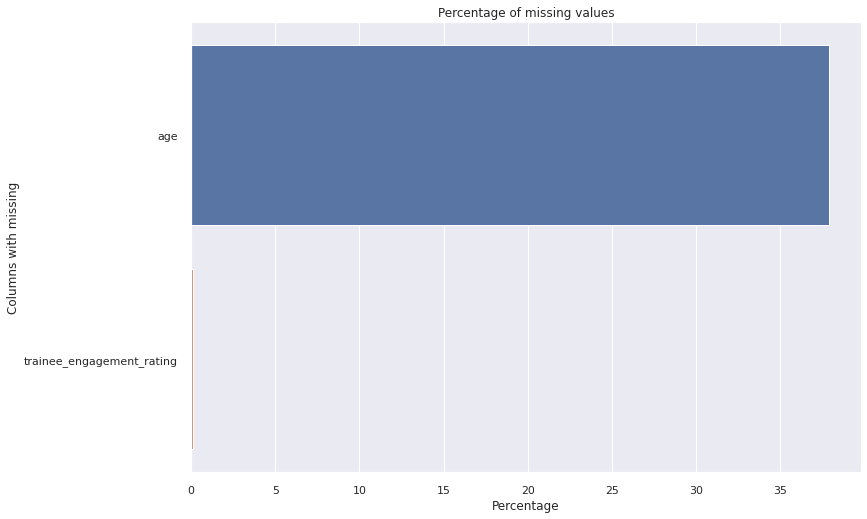

In [0]:

sb.barplot(y = 'Name', x = 'Percentage', 
           data=missing[missing.Percentage>0.00]).set(title="Percentage of missing values", ylabel="Columns with missing")
plt.show()

[Text(0.5, 0, 'Age'), Text(0.5, 1.0, 'Histogram of Age without imputation')]

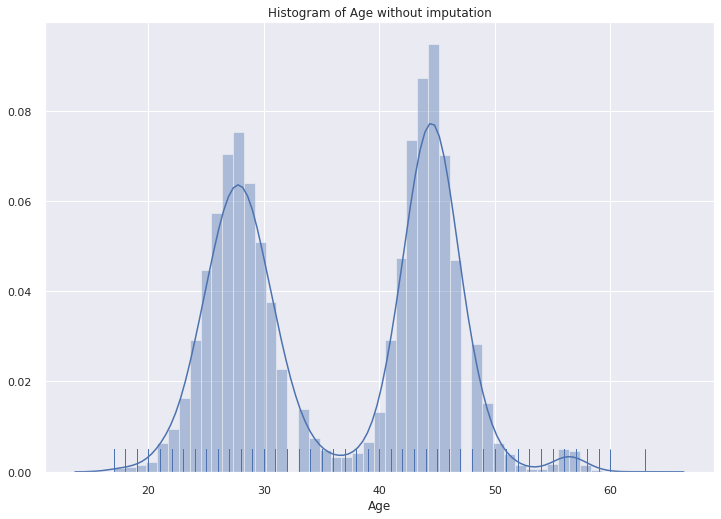

In [0]:
sb.distplot(train.age,kde=True, rug=True).set(title = 'Histogram of Age without imputation', xlabel = 'Age') 

[Text(0.5, 1.0, 'Trainee engagment rating')]

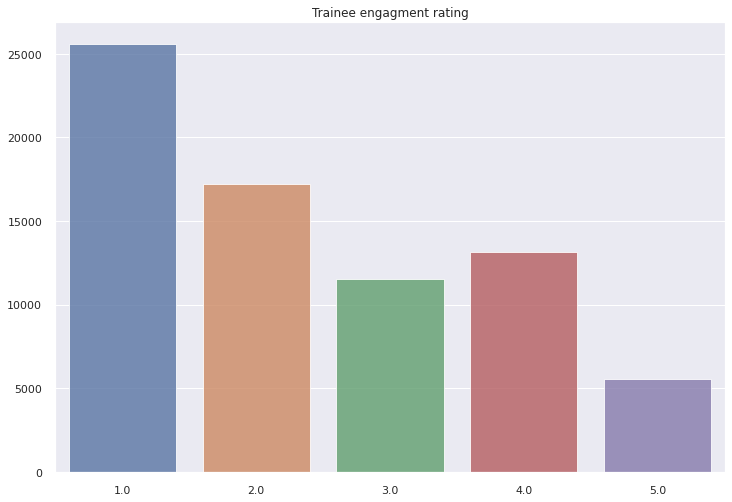

In [0]:
trainee_count  = train.trainee_engagement_rating.value_counts()

sb.barplot(trainee_count.index, trainee_count.values, alpha=0.8).set(title="Trainee engagment rating")

In [0]:
# impute trainee_engagement_rating
most_prob = train.trainee_engagement_rating .value_counts().index[0]

train.trainee_engagement_rating = train.trainee_engagement_rating.fillna(most_prob)
test.trainee_engagement_rating = test.trainee_engagement_rating.fillna(most_prob)

missing_values(train)

,Name,Percentage
0,id,0.00
1,program_id,0.00
2,program_type,0.00
3,program_duration,0.00
4,test_id,0.00
5,test_type,0.00
6,difficulty_level,0.00
7,trainee_id,0.00
8,gender,0.00
9,education,0.00


In [0]:
from sklearn.impute import SimpleImputer
import numpy as np

strategies = ["mean", 'most_frequent', 'constant']
temp = {}

for strat in strategies:
  imp = SimpleImputer(missing_values=np.nan, strategy=strat)
  tr = imp.fit_transform(train[["age"]]).ravel()
  temp[strat] = tr.astype("int")

imput = pd.DataFrame(temp)

In [0]:
cols = imput.columns.to_list()
cols.insert(0,"no_imputation")
cols

['no_imputation', 'mean', 'most_frequent', 'constant']

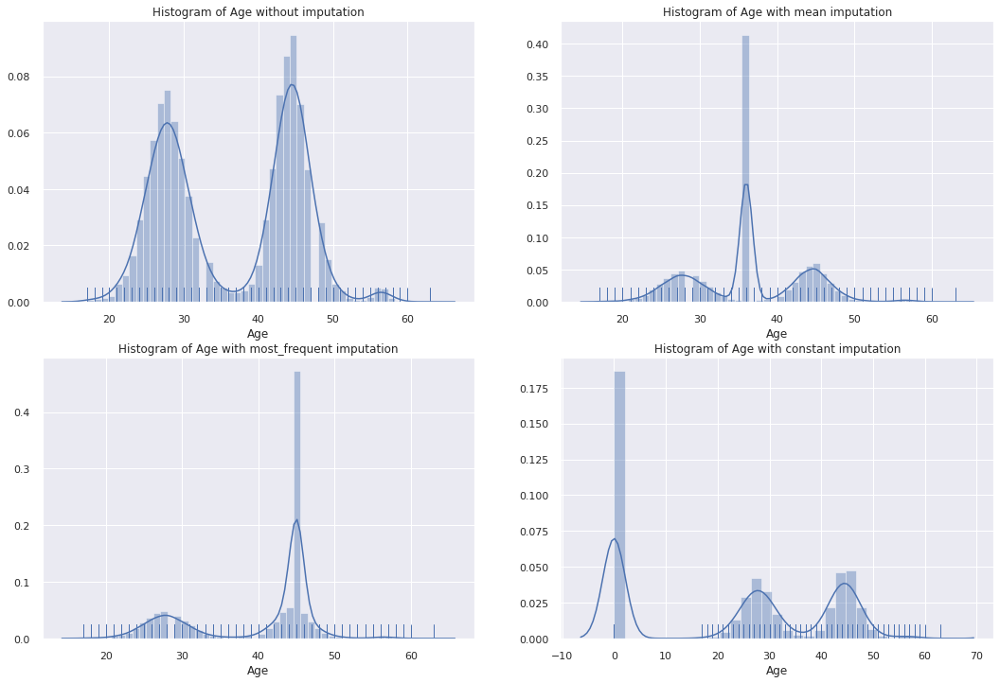

In [0]:
f = plt.figure(figsize=(18,12))

for i, name in enumerate(cols):
  f.add_subplot(2, 2, i+1)
  if name == "no_imputation":
    sb.distplot(train.age,kde=True, rug=True).set(
        title = 'Histogram of Age without imputation', xlabel = 'Age')
  else : 
    sb.distplot(imput[name],kde=True, rug=True).set(
        title = 'Histogram of Age with {} imputation'.format(name), xlabel = 'Age')

plt.show()


In [0]:
train.columns.values

array(['id', 'program_id', 'program_type', 'program_duration', 'test_id',
       'test_type', 'difficulty_level', 'trainee_id', 'gender',
       'education', 'city_tier', 'age', 'total_programs_enrolled',
       'is_handicapped', 'trainee_engagement_rating', 'is_pass'],
      dtype=object)

In [0]:
drop_columns = ['id', 
                'program_id', 
                #'test_id', 
                #'trainee_id', 
                'age']


train_drop = train.drop(drop_columns , axis=1)

train_drop.head()

,program_type,program_duration,test_id,test_type,difficulty_level,trainee_id,gender,education,city_tier,total_programs_enrolled,is_handicapped,trainee_engagement_rating,is_pass
0,Y,136,150,offline,intermediate,9389,M,Matriculation,3,5,N,1.0,0
1,T,131,44,offline,easy,16523,F,High School Diploma,4,2,N,3.0,1
2,Z,120,178,online,easy,13987,M,Matriculation,1,1,N,2.0,1
3,T,117,32,offline,easy,13158,F,Matriculation,3,4,N,1.0,1
4,V,131,84,offline,intermediate,10591,F,High School Diploma,1,2,N,4.0,1


In [0]:
test_drop = test.drop(drop_columns, axis=1)

test_drop.head()

,program_type,program_duration,test_id,test_type,difficulty_level,trainee_id,gender,education,city_tier,total_programs_enrolled,is_handicapped,trainee_engagement_rating
0,T,131,45,offline,intermediate,1626,F,Matriculation,3,2,N,4.0
1,Y,135,130,online,easy,11020,M,Bachelors,3,4,N,4.0
2,Y,120,146,online,easy,12652,M,Matriculation,3,2,N,3.0
3,V,122,72,offline,vary hard,7038,F,High School Diploma,1,2,N,2.0
4,V,122,71,offline,intermediate,888,F,Matriculation,3,2,N,2.0


In [0]:
train_drop.dtypes

program_type                  object
program_duration               int64
test_id                        int64
test_type                     object
difficulty_level              object
trainee_id                     int64
gender                        object
education                     object
city_tier                     object
total_programs_enrolled        int64
is_handicapped                object
trainee_engagement_rating    float64
is_pass                       object
dtype: object

# Feature Encoding

In [0]:
transform_cols = ['program_type',
                  'test_type'
                  #,'city_tier'
                  ,'is_handicapped',
                  "gender",
                  #'trainee_engagement_rating'
                  ]

all_columns = train_drop.columns.values.tolist()

remain_cols = list(set(all_columns) - set(transform_cols))
remain_cols

['trainee_id',
 'test_id',
 'program_duration',
 'education',
 'difficulty_level',
 'city_tier',
 'is_pass',
 'total_programs_enrolled',
 'trainee_engagement_rating']

In [0]:
from sklearn_pandas import DataFrameMapper
from sklearn_pandas import gen_features
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelBinarizer

feature_def = gen_features(
    columns=transform_cols,
    classes=[LabelEncoder]
    )

mapper = DataFrameMapper(
    feature_def,
    default = None,
    df_out = True
)


In [0]:
mapper_fit = mapper.fit(train_drop)
train_processed = mapper.transform(train_drop)
train_processed = train_processed[all_columns]
train_processed.head()

,program_type,program_duration,test_id,test_type,difficulty_level,trainee_id,gender,education,city_tier,total_programs_enrolled,is_handicapped,trainee_engagement_rating,is_pass
0,5,136,150,0,intermediate,9389,1,Matriculation,3,5,0,1,0
1,1,131,44,0,easy,16523,0,High School Diploma,4,2,0,3,1
2,6,120,178,1,easy,13987,1,Matriculation,1,1,0,2,1
3,1,117,32,0,easy,13158,0,Matriculation,3,4,0,1,1
4,3,131,84,0,intermediate,10591,0,High School Diploma,1,2,0,4,1


In [0]:
test_processed = mapper.transform(test_drop)
test_processed.head()

,program_type,test_type,is_handicapped,gender,program_duration,test_id,difficulty_level,trainee_id,education,city_tier,total_programs_enrolled,trainee_engagement_rating
0,1,0,0,0,131,45,intermediate,1626,Matriculation,3,2,4
1,5,1,0,1,135,130,easy,11020,Bachelors,3,4,4
2,5,1,0,1,120,146,easy,12652,Matriculation,3,2,3
3,3,0,0,0,122,72,vary hard,7038,High School Diploma,1,2,2
4,3,0,0,0,122,71,intermediate,888,Matriculation,3,2,2


In [0]:
train.difficulty_level.value_counts()

easy            40101
intermediate    20668
hard            10297
vary hard        2081
Name: difficulty_level, dtype: int64

In [0]:
difficulty_mapping = {
    'vary hard': 4,
    'hard': 3,
    'intermediate': 2,
    'easy' : 1
}

#
train_processed.difficulty_level = train_processed.difficulty_level.map(difficulty_mapping)

test_processed.difficulty_level = test_processed.difficulty_level.map(difficulty_mapping)

In [0]:
train.education.value_counts()

High School Diploma    34371
Matriculation          26169
Bachelors              11581
No Qualification         514
Masters                  512
Name: education, dtype: int64

In [0]:
education_mapping = {'High School Diploma':3,
                     'Matriculation':2,
                     'Bachelors':4,
                     'Masters':5,
                     'No Qualification':1}


#
train_processed.education = train_processed.education.map(education_mapping)

test_processed.education = test_processed.education.map(education_mapping)

In [0]:
train_processed.head()

,program_type,program_duration,test_id,test_type,difficulty_level,trainee_id,gender,education,city_tier,total_programs_enrolled,is_handicapped,trainee_engagement_rating,is_pass
0,5,136,150,0,2,9389,1,2,3,5,0,1,0
1,1,131,44,0,1,16523,0,3,4,2,0,3,1
2,6,120,178,1,1,13987,1,2,1,1,0,2,1
3,1,117,32,0,1,13158,0,2,3,4,0,1,1
4,3,131,84,0,2,10591,0,3,1,2,0,4,1


In [0]:
test_processed.head()

,program_type,test_type,is_handicapped,gender,program_duration,test_id,difficulty_level,trainee_id,education,city_tier,total_programs_enrolled,trainee_engagement_rating
0,1,0,0,0,131,45,2,1626,2,3,2,4
1,5,1,0,1,135,130,1,11020,4,3,4,4
2,5,1,0,1,120,146,1,12652,2,3,2,3
3,3,0,0,0,122,72,4,7038,3,1,2,2
4,3,0,0,0,122,71,2,888,2,3,2,2


In [0]:
train_processed.dtypes

program_type                  int64
program_duration             object
test_id                      object
test_type                     int64
difficulty_level              int64
trainee_id                   object
gender                        int64
education                     int64
city_tier                    object
total_programs_enrolled      object
is_handicapped                int64
trainee_engagement_rating    object
is_pass                      object
dtype: object

In [0]:
train_processed = train_processed.astype({'program_duration': np.int, 
                                          'total_programs_enrolled': np.int ,
                                          'city_tier': np.int})


test_processed = test_processed.astype({'program_duration': np.int, 
                                          'total_programs_enrolled': np.int,
                                        'city_tier' : np.int})


In [0]:
train_processed.head()

,program_type,program_duration,test_id,test_type,difficulty_level,trainee_id,gender,education,city_tier,total_programs_enrolled,is_handicapped,trainee_engagement_rating,is_pass
0,5,136,150,0,2,9389,1,2,3,5,0,1,0
1,1,131,44,0,1,16523,0,3,4,2,0,3,1
2,6,120,178,1,1,13987,1,2,1,1,0,2,1
3,1,117,32,0,1,13158,0,2,3,4,0,1,1
4,3,131,84,0,2,10591,0,3,1,2,0,4,1


In [0]:
test_processed.head()

,program_type,test_type,is_handicapped,gender,program_duration,test_id,difficulty_level,trainee_id,education,city_tier,total_programs_enrolled,trainee_engagement_rating
0,1,0,0,0,131,45,2,1626,2,3,2,4
1,5,1,0,1,135,130,1,11020,4,3,4,4
2,5,1,0,1,120,146,1,12652,2,3,2,3
3,3,0,0,0,122,72,4,7038,3,1,2,2
4,3,0,0,0,122,71,2,888,2,3,2,2


# Model building

In [0]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler


from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier


from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,classification_report

In [0]:
x=train_processed.loc[:,["test_id", "program_type", "trainee_id"]].values  #.drop('is_pass',axis=1).values
y=LabelEncoder().fit_transform(train_processed.is_pass)

In [0]:
x

array([[150, 5, 9389],
       [44, 1, 16523],
       [178, 6, 13987],
       ...,
       [142, 5, 13063],
       [82, 3, 5667],
       [119, 5, 4467]], dtype=object)

In [0]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=101)

In [0]:
names = ["Logistic Regression",
         "Decision Tree", 
         "Random Forest", 
         "AdaBoost",
         "Xgboost",
         'ExtraTrees'
         ]

classifiers = [
    LogisticRegression(),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=12, n_estimators=10, max_features=1),
    AdaBoostClassifier(),
    XGBClassifier(),
    ExtraTreesClassifier()
    ]


In [0]:
res = {}


for name, clf in zip(names, classifiers):
  pipeline = Pipeline([ #('scaler1',StandardScaler()),
                        (name + '_classifier',clf)
                      ])
  pipeline.fit(x_train, y_train)
  score = clf.score(x_test, y_test)
  res[name] = score

In [0]:
res

{'AdaBoost': 0.6933697881066302,
 'Decision Tree': 0.6947368421052632,
 'ExtraTrees': 0.6329004329004329,
 'Logistic Regression': 0.6933697881066302,
 'Random Forest': 0.7029847345636819,
 'Xgboost': 0.696969696969697}

In [0]:
 clf = XGBClassifier(class_weight = 'balanced', 
                     max_depth = 20, n_estimators = 800)
 
clf.fit(x_train, y_train)

score = clf.score(x_test, y_test)
score

0.7233538391433129

In [0]:
importances = clf.feature_importances_
indices = np.argsort(importances)


Text(0.5, 0, 'Relative Importance')

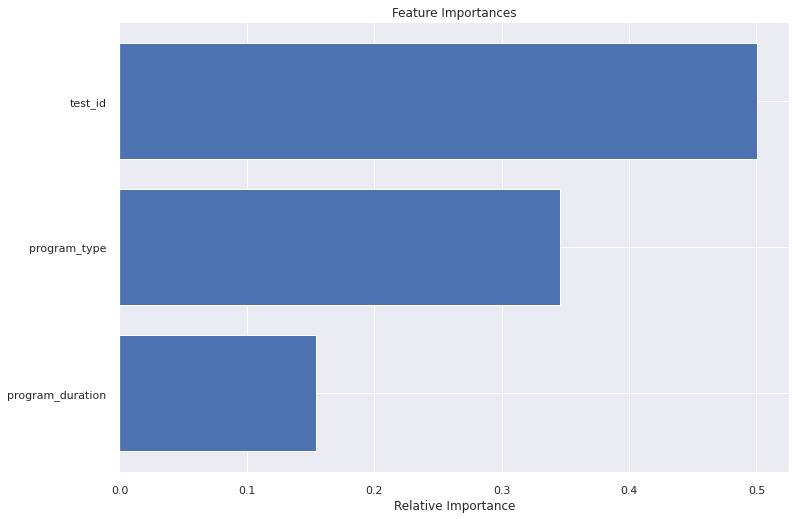

In [0]:
features = train_processed.columns[:-1]

plt.figure(1)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')

In [0]:
predictions = p.predict( test_processed[train_processed.columns[:-1]].values)

In [0]:
x = train_processed.drop('is_pass',axis=1)
y = LabelEncoder().fit_transform(train_processed.is_pass)

In [0]:
from catboost import CatBoostClassifier,Pool

In [0]:
model = CatBoostClassifier(
        iterations=5000,logging_level="Silent",early_stopping_rounds=500,
    use_best_model=True,custom_loss=["AUC"], 
        eval_metric="AUC")

In [0]:
cat_features=[0,2,5] 

model.fit(  x_train,y_train, 
        cat_features=cat_features,
        eval_set=(x_test,y_test),
        plot=True 
        )


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [0]:
model.get_feature_importance(prettified=True)

,Feature Id,Importances
0,5,26.655839
1,2,23.353227
2,0,13.840277
3,11,12.252085
4,8,4.729417
5,7,4.233210
6,9,3.530843
7,1,3.500451
8,4,3.430964
9,3,1.673980


In [0]:
import shap

shap.initjs()
shap.force_plot(expected_value, shap_values[3,:], x.iloc[3,:])

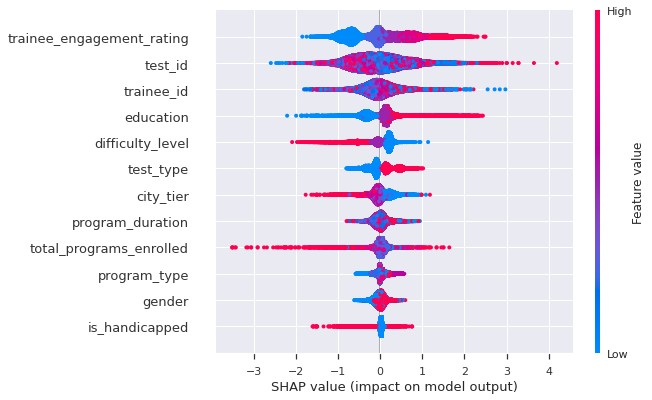

In [0]:
shap.summary_plot(shap_values, x)

In [0]:

pool1 = Pool(data=x, label=y)

metrics = model.eval_metrics(
    data=pool1,
    metrics=['Logloss','AUC'],
    ntree_start=0,
    ntree_end=0,
    eval_period=1,
    plot=True
)



In [0]:
from sklearn.metrics import roc_auc_score

roc_auc_score(y_test, model.predict_proba(x_test) [:,1]) 



0.8230374810584131

In [0]:
from sklearn.utils import class_weight
cw = list(class_weight.compute_class_weight('balanced',
                                             np.unique(train_processed['is_pass']),
                                             train_processed['is_pass']))
cw

[1.6415394973070019, 0.7190024967070989]

In [0]:
df = pd.DataFrame({'id': test.id, 'is_pass': predictions})



In [0]:
df.to_csv('Submission.csv', index=False)


In [0]:
def encode_features(df_train, df_test):
    features = ['Fare', 'Cabin', 'Age', 'Sex', 'Lname', 'NamePrefix']
    df_combined = pd.concat([df_train[features], df_test[features]])
    
    for feature in features:
        le = preprocessing.LabelEncoder()
        le = le.fit(df_combined[feature])
        df_train[feature] = le.transform(df_train[feature])
        df_test[feature] = le.transform(df_test[feature])
    return df_train, df_test
    

N    66577
Y     6570
Name: is_handicapped, dtype: int64

In [0]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

class MultiColumnLabelEncoder:
    def __init__(self,columns = None):
        self.columns = columns # array of column names to encode

    def fit(self,X,y=None):
        return self # not relevant here

    def transform(self,X):
        '''
        Transforms columns of X specified in self.columns using
        LabelEncoder(). If no columns specified, transforms all
        columns in X.
        '''
        output = X.copy()
        if self.columns is not None:
            for col in self.columns:
                output[col] = LabelEncoder().fit_transform(output[col])
        else:
            for colname,col in output.iteritems():
                output[colname] = LabelEncoder().fit_transform(col)
        return output

    def fit_transform(self,X,y=None):
        return self.fit(X,y).transform(X)

In [0]:
# import missingno as msno
# msno.bar(train,color = "blue")

In [0]:
train = train.drop(columns =["age"])
train.trainee_engagement_rating = train.trainee_engagement_rating.astype(object)

train.dtypes

program_id                   object
program_type                 object
program_duration              int64
test_type                    object
difficulty_level             object
gender                       object
education                    object
city_tier                    object
total_programs_enrolled       int64
is_handicapped               object
trainee_engagement_rating    object
is_pass                      object
dtype: object

In [0]:
train.education.value_counts()

High School Diploma    34371
Matriculation          26169
Bachelors              11581
No Qualification         514
Masters                  512
Name: education, dtype: int64

In [0]:
# Importing module and initializing setup
from pycaret.classification import *

clf = setup(data = train_processed.iloc[:,[0,2,5,12]], target = 'is_pass',
              #normalize = True,
              #transformation = True, 
              #ignore_low_variance = True,
              #remove_multicollinearity = True,
              #feature_selection = True,
              #multicollinearity_threshold = 0.95,
              #ordinal_features = {'difficulty_level' : ['easy', 'intermediate', 'hard','vary hard'],
              #                   'education':['No Qualification', 'Matriculation', 'High School Diploma', 'Bachelors', 'Masters'}
                                              )

 
Setup Succesfully Completed!


,Description,Value
0,session_id,8458
1,Target Type,Binary
2,Label Encoded,None
3,Original Data,"(73147, 4)"
4,Missing Values,False
5,Numeric Features,2
6,Categorical Features,1
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


In [0]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,Gradient Boosting Classifier,0.697200,0.653000,0.982200,0.701700,0.818500,0.038500
1,Linear Discriminant Analysis,0.696700,0.592200,0.989500,0.699200,0.819400,0.024100
2,CatBoost Classifier,0.696700,0.654600,0.943700,0.713000,0.812300,0.096400
3,Ridge Classifier,0.696100,0.000000,0.989900,0.698700,0.819200,0.020800
4,Extreme Gradient Boosting,0.696000,0.651700,0.983700,0.700400,0.818200,0.030800
5,Light Gradient Boosting Machine,0.695700,0.648500,0.930800,0.716500,0.809700,0.111000
6,Ada Boost Classifier,0.695500,0.633200,0.989200,0.698500,0.818800,0.019400
7,Logistic Regression,0.695400,0.580500,1.000000,0.695400,0.820300,0.000000
8,Naive Bayes,0.650300,0.589700,0.785000,0.731700,0.757000,0.134200
9,K Neighbors Classifier,0.646900,0.547100,0.829700,0.710900,0.765600,0.066400


In [0]:
clf1 = setup(data = train_processed, target = 'is_pass')

 
Setup Succesfully Completed!


,Description,Value
0,session_id,7273
1,Target Type,Binary
2,Label Encoded,None
3,Original Data,"(73147, 13)"
4,Missing Values,False
5,Numeric Features,2
6,Categorical Features,10
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


In [0]:
clf = tune_model("catboost", n_iter= 1000, optimize="AUC", verbose = False)

In [0]:
predict_model(clf);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,CatBoost Classifier,0.7266,0.7158,0.9168,0.7473,0.8234,0.2448


In [0]:
final_ = finalize_model(tuned_bagged)

In [0]:
unseen_predictions = predict_model(final_, data=test_processed[train_processed.columns[:-1]])
unseen_predictions.head()


,program_type,program_duration,test_id,test_type,difficulty_level,trainee_id,gender,education,city_tier,total_programs_enrolled,is_handicapped,trainee_engagement_rating,Label,Score
0,1,131,45,0,2,1626,0,2,3,2,0,4,1,0.6898
1,5,135,130,1,1,11020,1,4,3,4,0,4,1,0.9597
2,5,120,146,1,1,12652,1,2,3,2,0,3,1,0.8740
3,3,122,72,0,4,7038,0,3,1,2,0,2,1,0.5520
4,3,122,71,0,2,888,0,2,3,2,0,2,1,0.5215


In [0]:
test_indx = test.id
test = test.drop(columns=["id","test_id","trainee_id","age"], axis=1)

test.city_tier = test.city_tier.astype(object)
test.trainee_engagement_rating = test.trainee_engagement_rating.astype(object)
test.dtypes

program_id                   object
program_type                 object
program_duration              int64
test_type                    object
difficulty_level             object
gender                       object
education                    object
city_tier                    object
total_programs_enrolled       int64
is_handicapped               object
trainee_engagement_rating    object
dtype: object

In [0]:
dataset = unseen_predictions[["id","Label"]]
dataset

,id,Label
0,1626_45,1
1,11020_130,1
2,12652_146,1
3,7038_72,1
4,888_71,1
...,...,...
31344,18820_22,1
31345,1641_96,1
31346,7010_157,1
31347,14895_179,1


In [0]:
dataset.columns = ["id","is_pass"]
dataset.head()

,id,is_pass
0,1626_45,1
1,11020_130,1
2,12652_146,1
3,7038_72,1
4,888_71,1


In [0]:
dataset.to_csv('/content/dataset.csv', index=False)

